## Capstone Project

>- Name: Vinayak Modgil<br>
>- Student pace: Full time<br>
>- Scheduled Project review date: <br>
>- Instructor Name: Yish Lim<br>
>- Github URL: 

## Predicting Stock Market Prices
<br>
by Vinayak Modgil
<br>


## Project Description and Business Statement

What I am trying to accomplish with the project
1. Build a model that will predict whether a stock price will increase or decrease the next day
2. Prediction based on the amount of volume exchanged by the end of a certain day.
3. The price of a stock at the end of the day is different than at the beginning of the next day. I want to retreive this difference and figure out if stock price will go up or down based on previous data.
4. If model predicts that stock price will go up, buy at the end of the day and sell right away the next day.
5. Model will not be even close to 100% accuracy as this is an impossible feat. However, an accuracy of over 60% will give a net gain in the long run.

## Analysis and Methodology

> - [Data Collection](#Data-Collection)

## Data Collection

In [70]:
#General packages
import os
import random
import warnings 
warnings.filterwarnings("ignore")
from random import gauss

#Data wrangling packages
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")
import seaborn as sns

#Statistical analysis package
import statsmodels.tsa.api as tsa
import statsmodels.api as sm
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

#Machine Learning packages
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression

#More sklearn packages
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

#Metrics packages
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score

#Deep Learning packages
from keras.models import Sequential
from keras.layers import LSTM, Conv2D, Dense, Flatten
from keras.layers import MaxPooling2D, Dropout, Activation
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16

#Hyperparameter tuning
import talos
from sklearn.model_selection import GridSearchCV

#Dl model understanding
import lime
from lime import lime_image
from lime import lime_base
from skimage.segmentation import mark_boundaries

# Created functions
import time_series_functions as tsf

In [71]:
capstone_data = pd.read_csv("stock market/Nifty50_target_data.csv")
capstone_data

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2007-11-27,MUNDRAPORT,EQ,440.00,770.00,1050.00,770.00,959.00,962.90,984.72,27294366,2.687719e+15,NaN,9859619.0,0.3612
1,2007-11-28,MUNDRAPORT,EQ,962.90,984.00,990.00,874.00,885.00,893.90,941.38,4581338,4.312765e+14,NaN,1453278.0,0.3172
2,2007-11-29,MUNDRAPORT,EQ,893.90,909.00,914.75,841.00,887.00,884.20,888.09,5124121,4.550658e+14,NaN,1069678.0,0.2088
3,2007-11-30,MUNDRAPORT,EQ,884.20,890.00,958.00,890.00,929.00,921.55,929.17,4609762,4.283257e+14,NaN,1260913.0,0.2735
4,2007-12-03,MUNDRAPORT,EQ,921.55,939.75,995.00,922.00,980.00,969.30,965.65,2977470,2.875200e+14,NaN,816123.0,0.2741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235187,2021-04-26,ZEEL,EQ,188.00,190.60,191.10,185.10,186.70,186.40,187.35,8542755,1.600451e+14,52374.0,2340188.0,0.2739
235188,2021-04-27,ZEEL,EQ,186.40,188.00,192.95,186.80,188.80,188.15,189.41,14247767,2.698636e+14,73673.0,5425957.0,0.3808
235189,2021-04-28,ZEEL,EQ,188.15,188.80,190.60,187.10,188.95,189.10,188.85,8429439,1.591917e+14,44056.0,2413974.0,0.2864
235190,2021-04-29,ZEEL,EQ,189.10,190.80,191.65,186.00,186.60,186.55,187.44,9483009,1.777471e+14,60932.0,2744472.0,0.2894


In [72]:
def get_data(csv_list, folder="stock market/NSE"):
    '''
    Merges a list of csv files and
    returns a new DataFrame containing
    all the csv files in the folder
    
    get_data -> (Args)
    csv_list: A list of csv files
    folder: Folder containing all the files
    '''
    #Specify the path to csv files
    stock_list = os.listdir(folder)
    #Initialize a DataFrame
    csv_merged = pd.DataFrame()
    
    for stock in stock_list:
        #List of files to be merged
        csv_list.append(pd.read_csv(folder +"/" + stock))
        
        for csv_file in csv_list:
            
            #Add the elements of csv_list to csv_merged
            csv_merged = csv_merged.append(csv_file, ignore_index=True)
            
        # Export the data to the folder
        csv_merged.to_csv("NSE.csv", index=False)
    return csv_merged

In [73]:
NSE_data = get_data([])

In [74]:
NSE_data

,Date,Symbol,Open,High,Low,Close,Adj Close,Volume
0,19-09-2011,ASTRAL,22.200005,22.542006,22.200005,22.320005,21.962229,59949.0
1,20-09-2011,ASTRAL,22.080006,23.040005,22.080006,22.428005,22.068493,47616.0
2,21-09-2011,ASTRAL,22.536005,22.536005,21.600004,21.912004,21.560766,55383.0
3,22-09-2011,ASTRAL,22.956005,26.298006,22.956005,26.094006,25.675737,4219573.0
4,23-09-2011,ASTRAL,26.310005,27.408007,23.520004,23.820005,23.438179,1986557.0
...,...,...,...,...,...,...,...,...
160443,13-09-2021,SUMCHEM,594.000000,603.000000,592.000000,603.000000,603.000000,7153400.0
160444,14-09-2021,SUMCHEM,610.000000,615.000000,604.000000,609.000000,609.000000,9194200.0
160445,15-09-2021,SUMCHEM,598.000000,599.000000,594.000000,597.000000,597.000000,7162400.0
160446,16-09-2021,SUMCHEM,599.000000,604.000000,594.000000,604.000000,604.000000,7663700.0


In [75]:
NSE_data.dropna(inplace=True)

In [76]:
NSE_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159971 entries, 0 to 160447
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date       159971 non-null  object 
 1   Symbol     159971 non-null  object 
 2   Open       159971 non-null  float64
 3   High       159971 non-null  float64
 4   Low        159971 non-null  float64
 5   Close      159971 non-null  float64
 6   Adj Close  159971 non-null  float64
 7   Volume     159971 non-null  float64
dtypes: float64(6), object(2)
memory usage: 11.0+ MB


In [77]:
#Display the info of capstone data
capstone_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235192 entries, 0 to 235191
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Date                235192 non-null  object 
 1   Symbol              235192 non-null  object 
 2   Series              235192 non-null  object 
 3   Prev Close          235192 non-null  float64
 4   Open                235192 non-null  float64
 5   High                235192 non-null  float64
 6   Low                 235192 non-null  float64
 7   Last                235192 non-null  float64
 8   Close               235192 non-null  float64
 9   VWAP                235192 non-null  float64
 10  Volume              235192 non-null  int64  
 11  Turnover            235192 non-null  float64
 12  Trades              120344 non-null  float64
 13  Deliverable Volume  219115 non-null  float64
 14  %Deliverble         219115 non-null  float64
dtypes: float64(11), int64(1), object(3

In [78]:
# Descriptive stats of capstone data
capstone_data.describe()

,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
count,235192.000000,235192.000000,235192.000000,235192.000000,235192.000000,235192.000000,235192.00000,2.351920e+05,2.351920e+05,1.203440e+05,2.191150e+05,219115.000000
mean,1266.196349,1267.759708,1286.581440,1247.488465,1266.388302,1266.554351,1267.13230,3.045903e+06,1.610138e+14,6.196427e+04,1.315098e+06,0.502997
std,2581.370320,2585.259609,2619.649216,2546.621396,2581.392543,2582.140942,2582.69998,7.333981e+06,3.298085e+14,6.866457e+04,2.831670e+06,0.190019
min,0.000000,8.500000,9.750000,8.500000,9.100000,9.150000,9.21000,3.000000e+00,1.047000e+07,1.100000e+01,5.000000e+00,0.023600
25%,274.300000,275.000000,279.500000,269.600000,274.400000,274.350000,274.69750,2.190095e+05,1.612816e+13,2.183400e+04,1.253830e+05,0.364700
50%,566.500000,567.025000,576.900000,556.500000,567.000000,566.700000,566.94000,1.010938e+06,6.832603e+13,4.406800e+04,5.017560e+05,0.511000
75%,1242.200000,1243.312500,1263.000000,1221.650000,1242.900000,1242.400000,1242.66250,3.019851e+06,1.863835e+14,7.893550e+04,1.452233e+06,0.638400
max,32861.950000,33399.950000,33480.000000,32468.100000,32849.000000,32861.950000,32975.24000,4.810589e+08,3.564334e+16,1.643015e+06,2.325307e+08,1.000000


In [79]:
NSE_data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,159971.000000,159971.000000,159971.000000,159971.000000,159971.000000,1.599710e+05
mean,405.620428,412.624278,398.607616,405.267878,399.129180,1.146307e+06
std,428.812688,437.118232,421.077925,428.456077,426.820208,3.518091e+06
min,12.000000,12.002500,11.502500,11.770000,11.558869,0.000000e+00
25%,145.095001,148.380005,142.649994,145.050003,140.408737,8.784000e+04
50%,270.000000,274.799988,265.450012,269.580078,264.336365,3.067940e+05
75%,518.000000,526.000000,509.649994,517.250000,510.933868,1.127008e+06
max,3975.000000,4067.399902,3888.850098,3960.449951,3960.449951,2.358938e+08


### Data Schema (capstone_data)
> - **Prev Close:** closing price of the previous trading day.
> - **Open:** first price at which a stock trades during regular market hours.
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Last:** final quoted trading price.
> - **Close:** closing price of the current trading day
> - **VWAP:** or volume-weighted average price. the average price a stock has traded at throughout the day, based on both volume and price.
> - **Volume:** the total number of shares that are actually traded.
> - **Turnover:** calculated by dividing the total number of shares traded during some period by the average number of shares outstanding for the same period.
> - **Trades:**  buying and selling shares in the secondary market on the same day.
> - **Deliverable Volume:** quantity of shares which actually move from one set of people (who had those shares in their demat account before today and are selling today)  to another set of people
> - **%Deliverable:**  Deliverable percentage is (Deliverable quantity / Traded quantity)

### Data Schema (NSE_data)
> - **Open:** first price at which a stock trades during regular market 
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Close:** closing price of the current trading day
> - **Adj Close:** adjusted closing price amends a stock's closing price to reflect that stock's value after accounting.
> - **Volume:** the total number of shares that are actually traded.

In [80]:
capstone_data["Symbol"].value_counts()

IOC           5306
CIPLA         5306
M&M           5306
ICICIBANK     5306
ONGC          5306
              ... 
MUNDRAPORT    1023
TELCO          999
KOTAKMAH       502
SSLT           388
JSWSTL         123
Name: Symbol, Length: 65, dtype: int64

In [81]:
def extract_data(df, no_of_symbols=0):
    '''
    Extracts the exact amount of stocks
    symbols required for EDA later.
    
    extract_data -> (Args)
    df - A DataFrame
    no_of_symbols - An int
    '''
    if no_of_symbols != 0:
        
        #Initialize an empty symbol_list
        symbol_list = []
        for symbol in df["Symbol"]:
            
            #Use break when the length of
            # symbol_list is equal to 
            # no_of_symbols
            if len(symbol_list) == no_of_symbols:
                break
                
            if  symbol not in symbol_list:
                #Append the symbol to the
                #symbol_list
                symbol_list.append(symbol)
    return symbol_list

In [82]:
#Extract rows needed for exploration
symbol_list = extract_data(capstone_data, no_of_symbols=50)
symbol_list = [i for i in symbol_list if i == "RELIANCE" or i =="POWERGRID" or i=="HDFCBANK" or i =="ICICIBANK" or i == "KOTAKBANK" or i == "ADANIPORTS"]

In [83]:
#Change the index to "Symbol" to extract relevant dataset
capstone_data = capstone_data.set_index("Symbol").loc[symbol_list]

In [84]:
#Set the date to datetime
capstone_data["Date"] = pd.to_datetime(capstone_data["Date"])

#Reset the index of the dataset
capstone_data.reset_index(inplace=True)

#Set the index to date for time series analysis
capstone_data.set_index("Date", inplace=True)

In [85]:
capstone_data

,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
Date,,,,,,,,,,,,,,
2012-01-17,ADANIPORTS,EQ,135.50,137.10,141.00,135.00,140.10,140.00,138.13,1636196,2.260074e+13,18374.0,1004327.0,0.6138
2012-01-18,ADANIPORTS,EQ,140.00,142.00,143.80,138.70,143.00,141.70,141.25,890591,1.257986e+13,15615.0,404925.0,0.4547
2012-01-19,ADANIPORTS,EQ,141.70,144.00,150.55,143.15,149.50,149.40,146.72,1456077,2.136382e+13,31299.0,721545.0,0.4955
2012-01-20,ADANIPORTS,EQ,149.40,151.90,157.60,150.25,155.40,155.40,153.76,1634070,2.512583e+13,23335.0,861145.0,0.5270
2012-01-23,ADANIPORTS,EQ,155.40,155.40,155.40,145.10,146.40,146.75,149.54,1657609,2.478768e+13,12400.0,820653.0,0.4951
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-26,RELIANCE,EQ,1904.35,1920.00,1962.00,1911.50,1938.00,1937.85,1941.32,9620785,1.867699e+15,259137.0,4276703.0,0.4445
2021-04-27,RELIANCE,EQ,1937.85,1940.00,1997.20,1938.25,1990.00,1988.65,1978.64,9226547,1.825602e+15,291197.0,3772144.0,0.4088
2021-04-28,RELIANCE,EQ,1988.65,1997.85,2008.00,1980.15,1993.15,1997.30,1997.60,7902002,1.578508e+15,247331.0,3921560.0,0.4963


In [86]:
capstone_data["Symbol"].value_counts()

HDFCBANK      5306
ICICIBANK     5306
RELIANCE      5306
KOTAKBANK     4483
POWERGRID     3359
ADANIPORTS    2299
Name: Symbol, dtype: int64

In [87]:
NSE_data["Date"] = pd.to_datetime(NSE_data["Date"])
NSE_data.set_index("Date", inplace=True)

In [88]:
NSE_data

,Symbol,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
2011-09-19,ASTRAL,22.200005,22.542006,22.200005,22.320005,21.962229,59949.0
2011-09-20,ASTRAL,22.080006,23.040005,22.080006,22.428005,22.068493,47616.0
2011-09-21,ASTRAL,22.536005,22.536005,21.600004,21.912004,21.560766,55383.0
2011-09-22,ASTRAL,22.956005,26.298006,22.956005,26.094006,25.675737,4219573.0
2011-09-23,ASTRAL,26.310005,27.408007,23.520004,23.820005,23.438179,1986557.0
...,...,...,...,...,...,...,...
2021-09-13,SUMCHEM,594.000000,603.000000,592.000000,603.000000,603.000000,7153400.0
2021-09-14,SUMCHEM,610.000000,615.000000,604.000000,609.000000,609.000000,9194200.0
2021-09-15,SUMCHEM,598.000000,599.000000,594.000000,597.000000,597.000000,7162400.0


In [90]:
capstone_data.isnull().sum()

Symbol                    0
Series                    0
Prev Close                0
Open                      0
High                      0
Low                       0
Last                      0
Close                     0
VWAP                      0
Volume                    0
Turnover                  0
Trades                11480
Deliverable Volume     1541
%Deliverble            1541
dtype: int64

In [91]:
cols_to_impute = ["Trades", "Deliverable Volume", "%Deliverble"]
impute_const_int = SimpleImputer(strategy="constant", missing_values=np.nan, fill_value=0)
capstone_data[cols_to_impute] = impute_const_int.fit_transform(capstone_data[cols_to_impute])


In [92]:
capstone_data.isnull().sum()

Symbol                0
Series                0
Prev Close            0
Open                  0
High                  0
Low                   0
Last                  0
Close                 0
VWAP                  0
Volume                0
Turnover              0
Trades                0
Deliverable Volume    0
%Deliverble           0
dtype: int64

## Feature Evaluation

(0.017806746010882366, 0.9641299761596628)

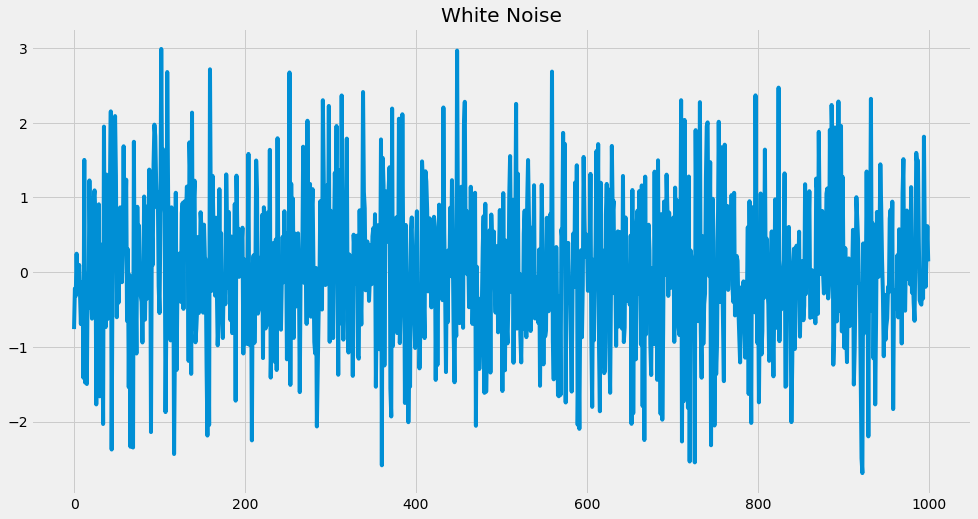

In [89]:
#White noise has mean=0, std=1
mean= 0
std = 1

#Make a white noise time series
noise = pd.Series([gauss(mean, std) for x in range(1000)])
noise.plot(title="White Noise", figsize=(15, 8))

## Check out mean and variance
noise.mean(), noise.var()

### RELIANCE

In [93]:
rel = capstone_data.loc[capstone_data["Symbol"] == "RELIANCE"]
rel["Deliverable Volume"].isnull().sum()

0

<AxesSubplot:>

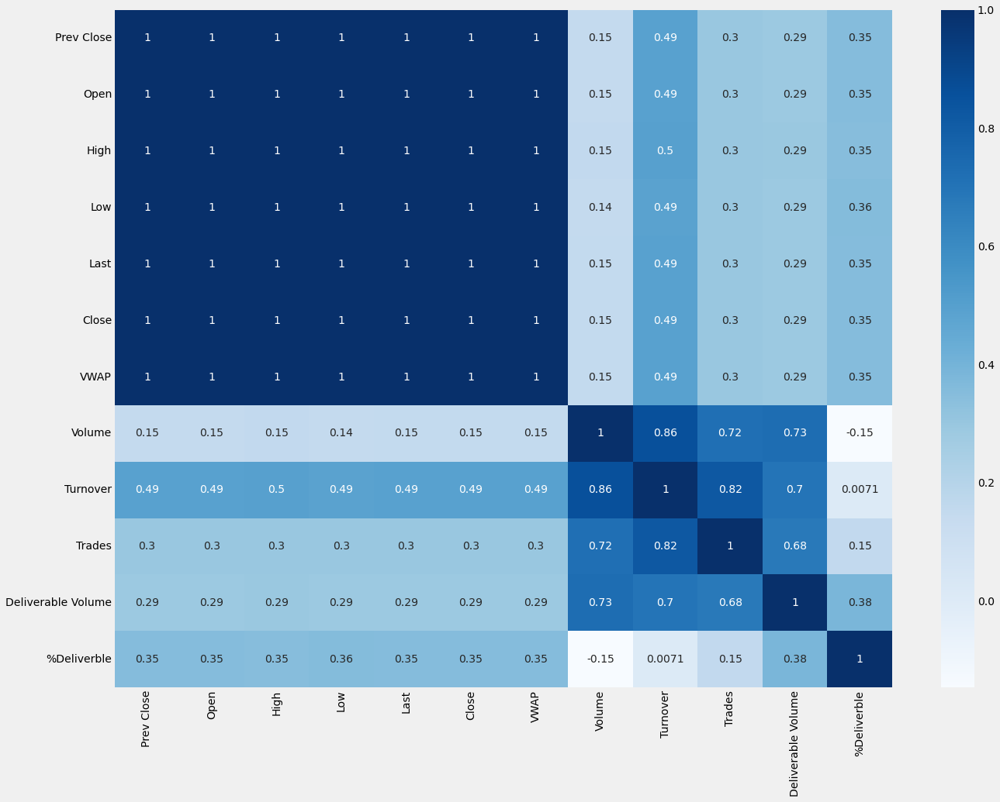

In [94]:
#Plot the heatmap of the dataset
plt.figure(figsize=(20, 15))
sns.heatmap(rel.corr(), annot=True, cmap="Blues")

#### Open

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-2.056568,0.262333,32,5273,False,False


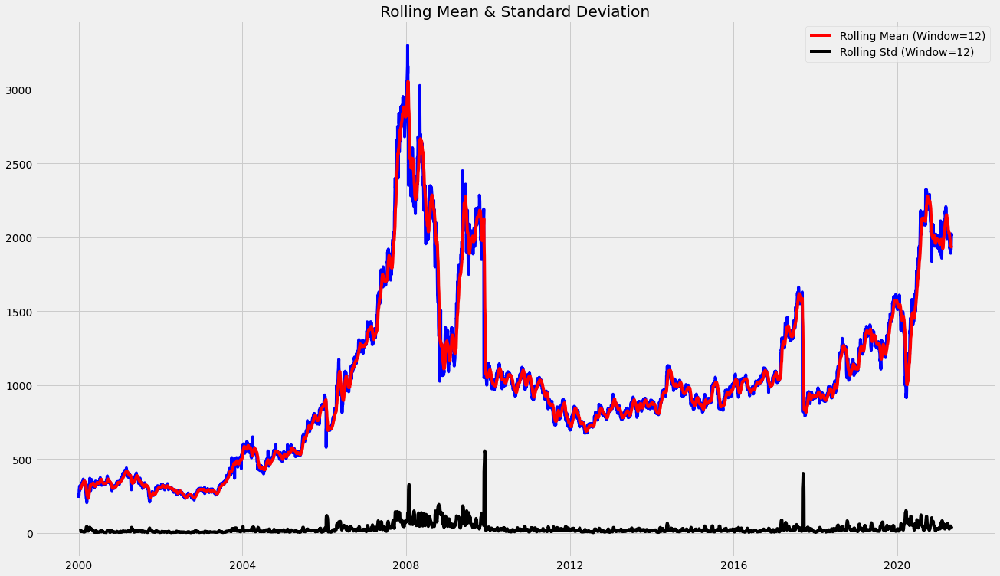

In [95]:
rel_open = rel[["Open"]]
tsf.stationarity_check(rel_open)

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-4.652559,0.000103,33,5271,True,True


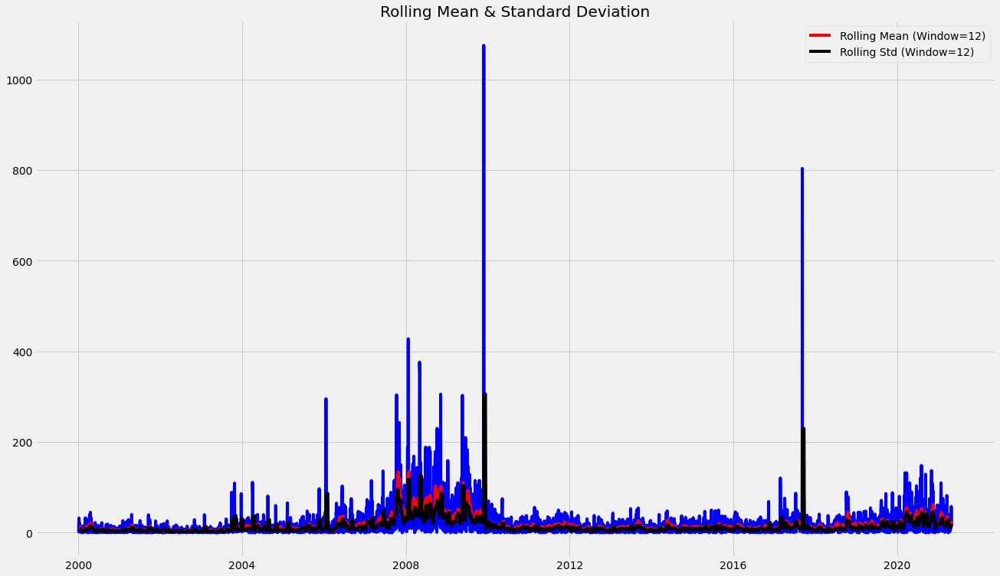

In [96]:
tsf.stationarity_check(rel_open.diff().abs().dropna())

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


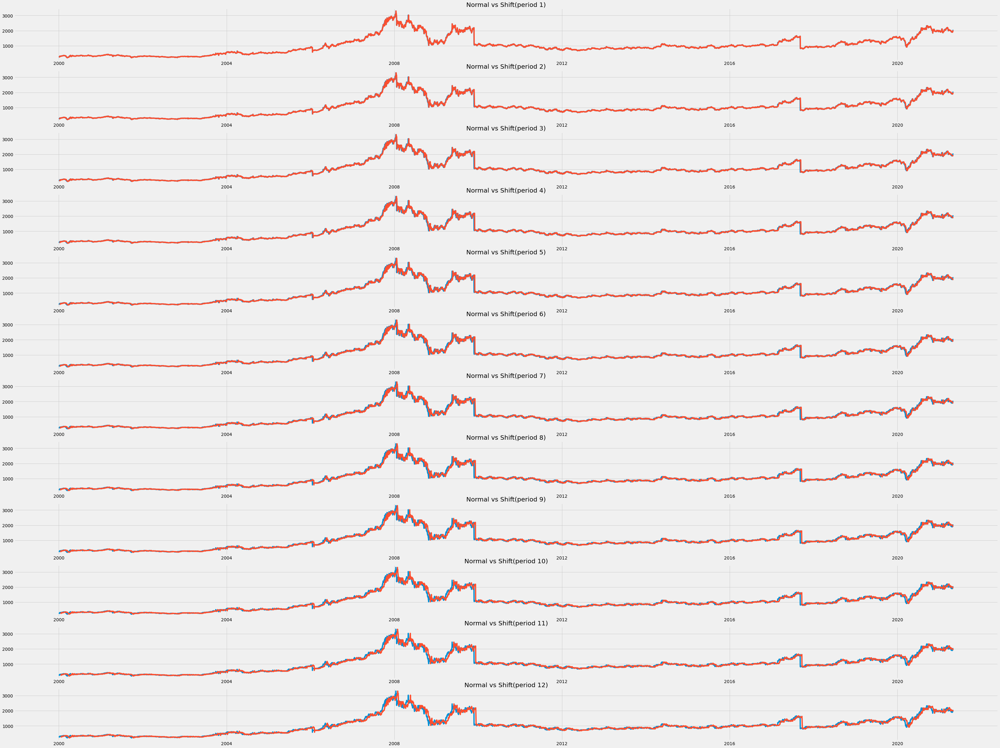

<Figure size 864x432 with 0 Axes>

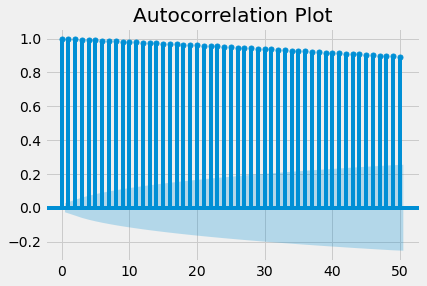

<Figure size 864x432 with 0 Axes>

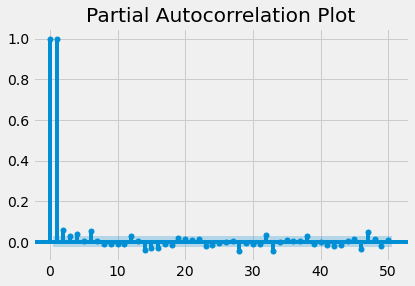

In [97]:
tsf.plot_autocorrelation(rel_open, verbose=1)

#### Close

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.849052,0.356395,20,5285,False,False


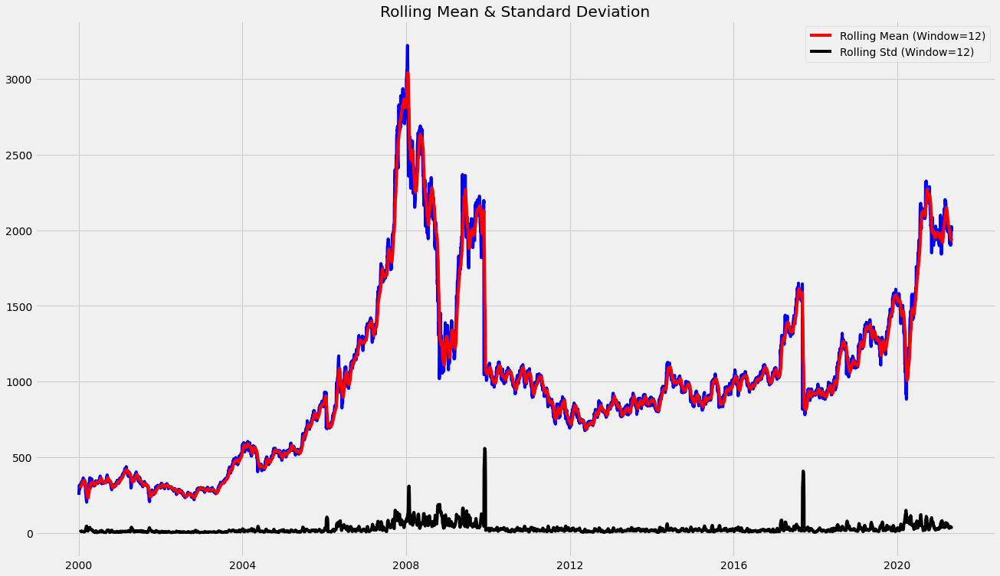

In [98]:
rel_close = rel[["Close"]]
tsf.stationarity_check(rel_close)

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-5.526351,0.000002,27,5277,True,True


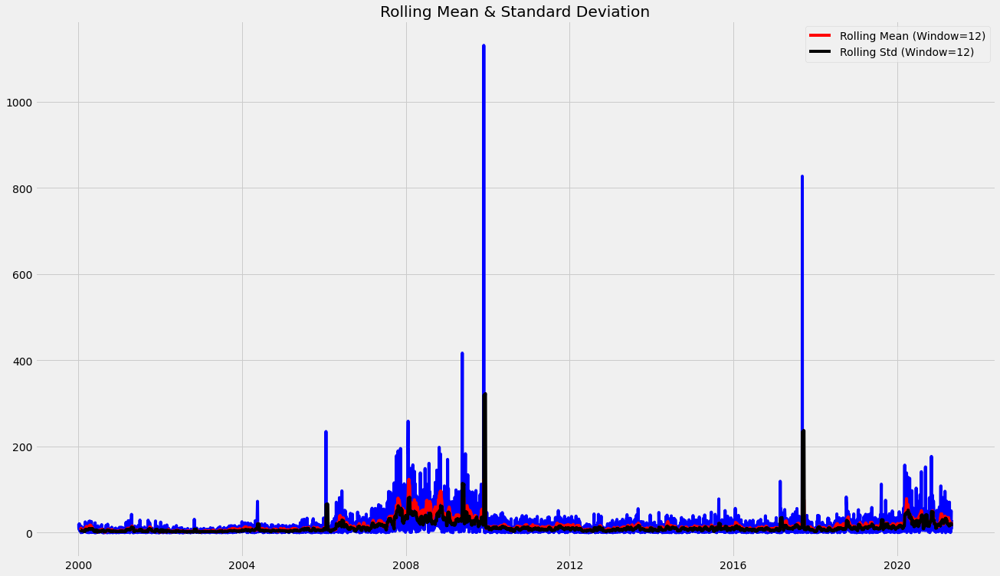

In [99]:
tsf.stationarity_check(rel_close.diff().abs().dropna())

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


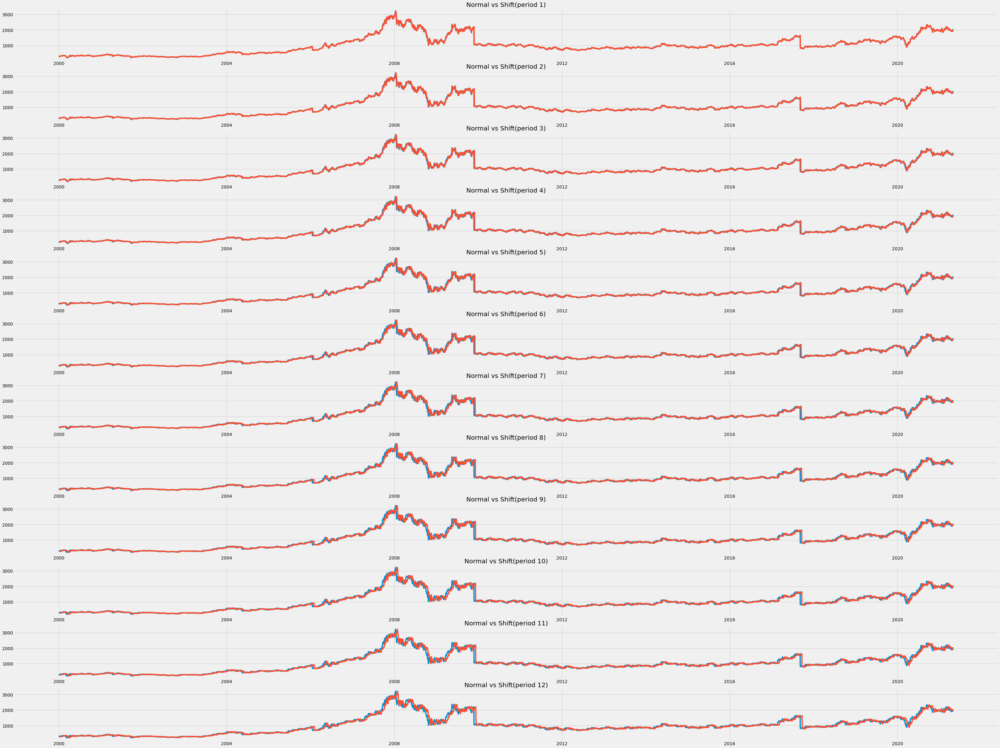

<Figure size 864x432 with 0 Axes>

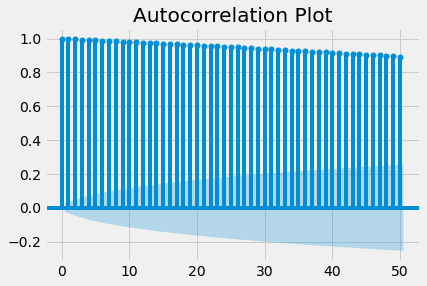

<Figure size 864x432 with 0 Axes>

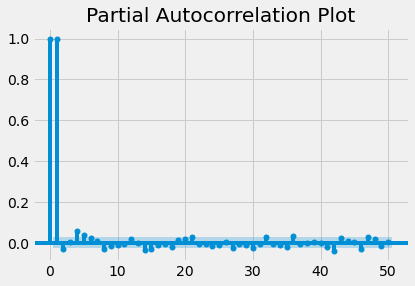

In [100]:
tsf.plot_autocorrelation(rel_close, verbose=1)

#### Prev Close

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.837241,0.362136,20,5285,False,False


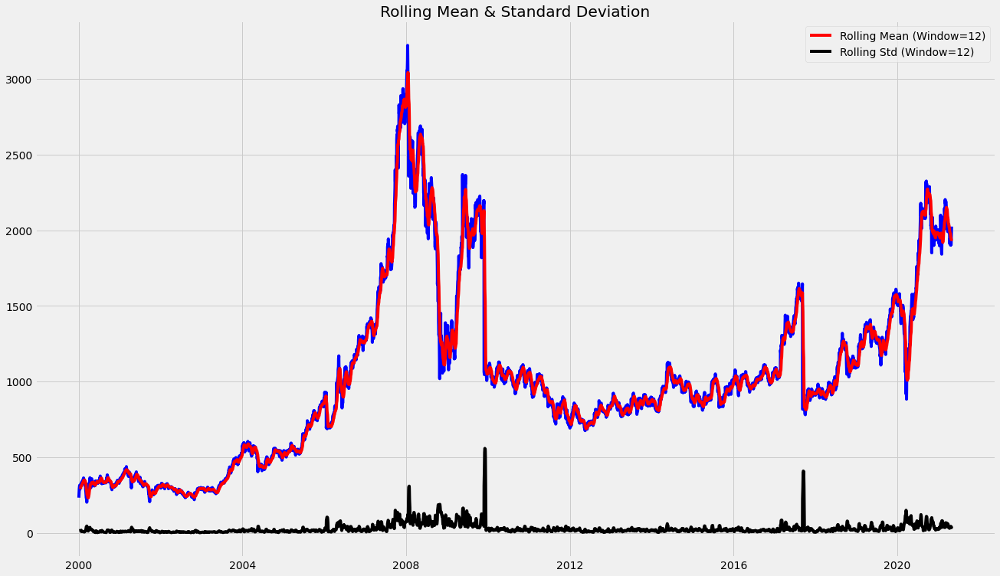

In [101]:
rel_prev_close = pd.Series(rel["Prev Close"])
tsf.stationarity_check(rel_prev_close)

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-5.527883,0.000002,27,5277,True,True


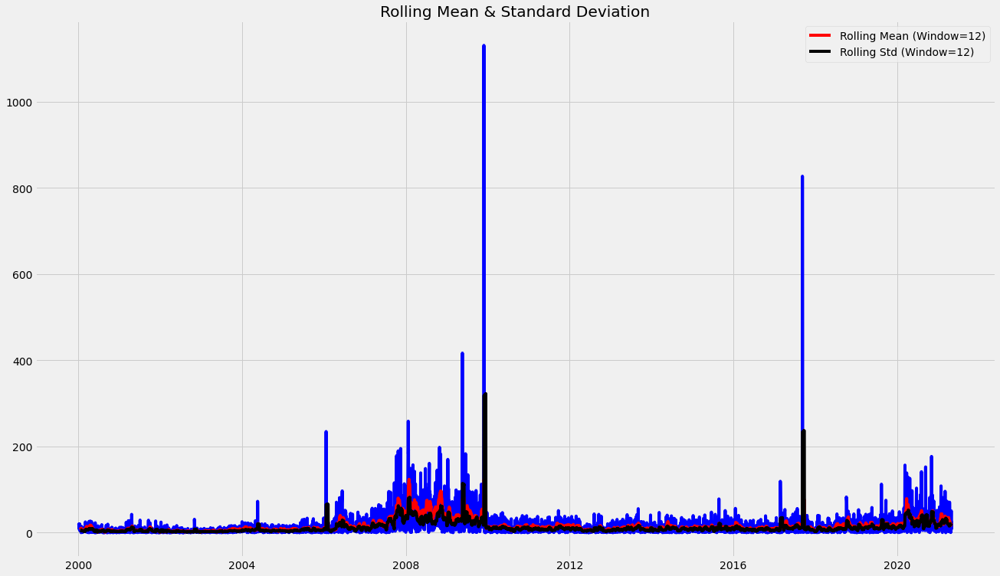

In [102]:
tsf.stationarity_check(rel_prev_close.diff().abs().dropna())

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


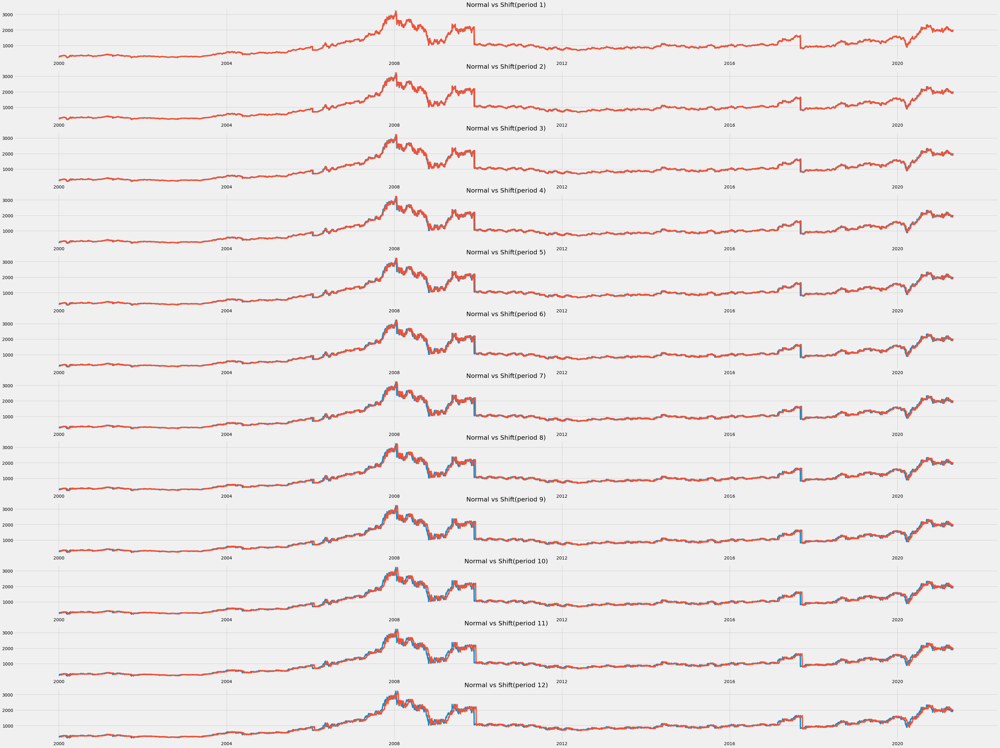

<Figure size 864x432 with 0 Axes>

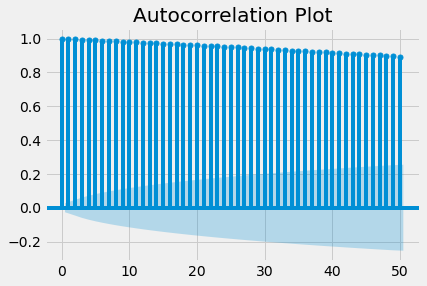

<Figure size 864x432 with 0 Axes>

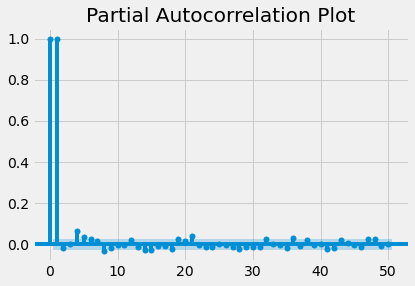

In [103]:
tsf.plot_autocorrelation(rel_prev_close, verbose=1)

#### High

In [104]:
rel_high = rel[["High"]]

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-2.055933,0.262599,32,5273,False,False


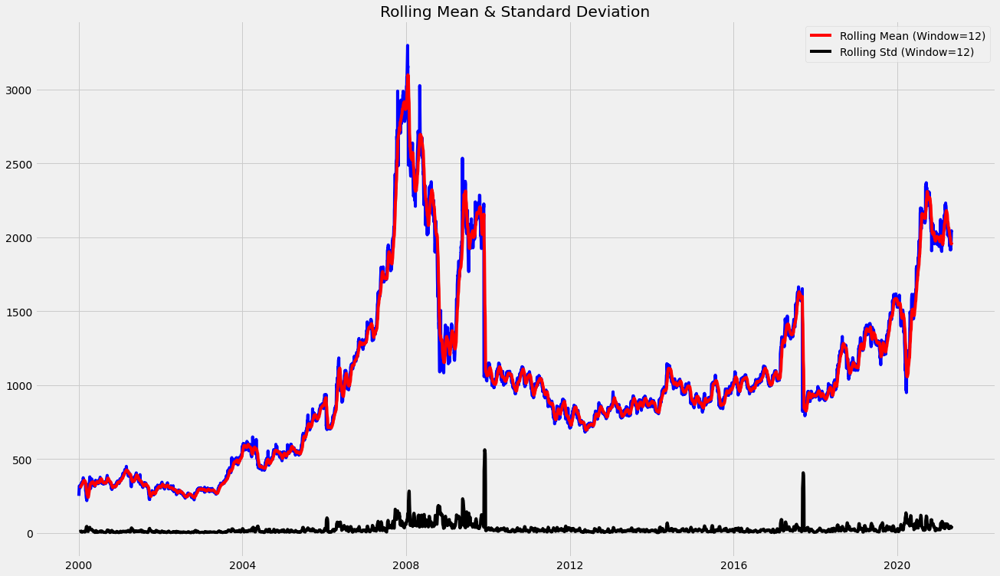

In [105]:
tsf.stationarity_check(rel_high)

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-5.122847,0.000013,33,5271,True,True


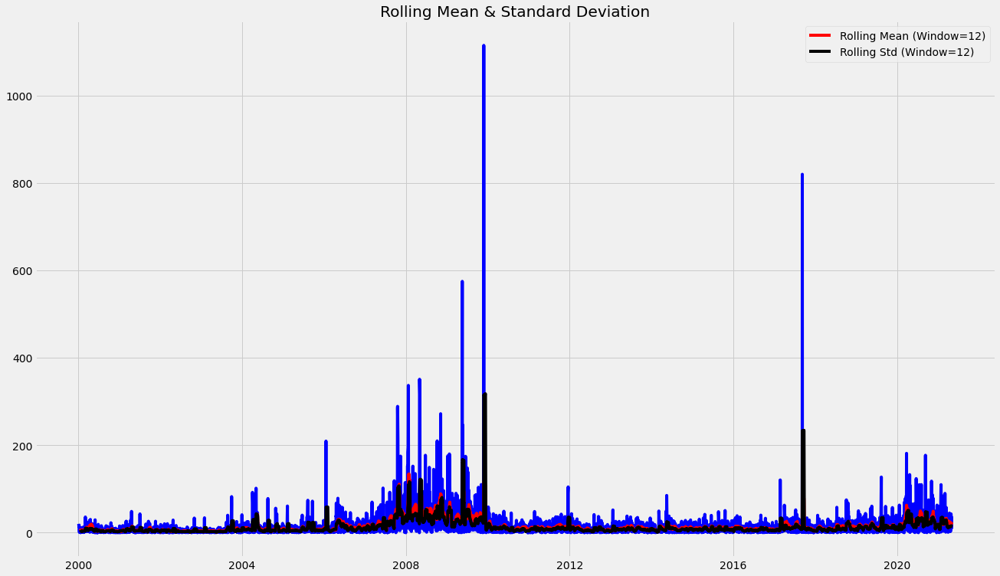

In [106]:
tsf.stationarity_check(rel_high.diff().abs().dropna())

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


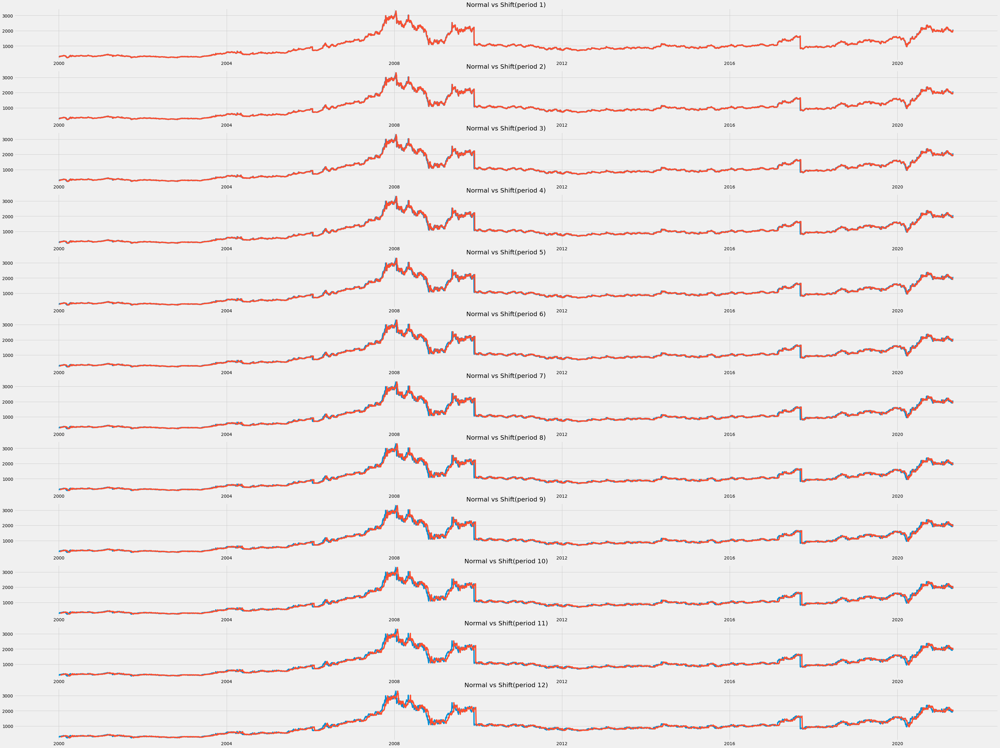

<Figure size 864x432 with 0 Axes>

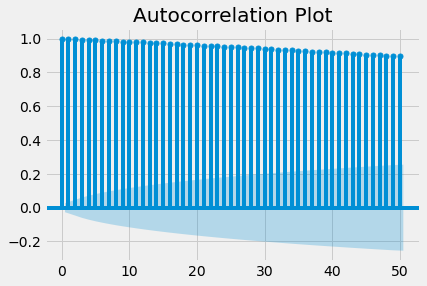

<Figure size 864x432 with 0 Axes>

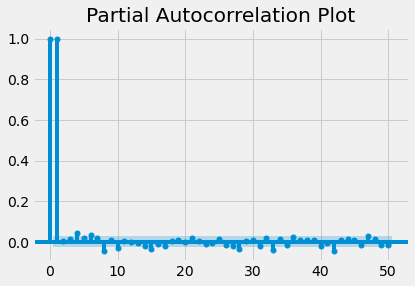

In [107]:
tsf.plot_autocorrelation(rel_high, verbose=1)

#### Low

In [108]:
rel_low = rel[["Low"]]

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.98966,0.291125,24,5281,False,False


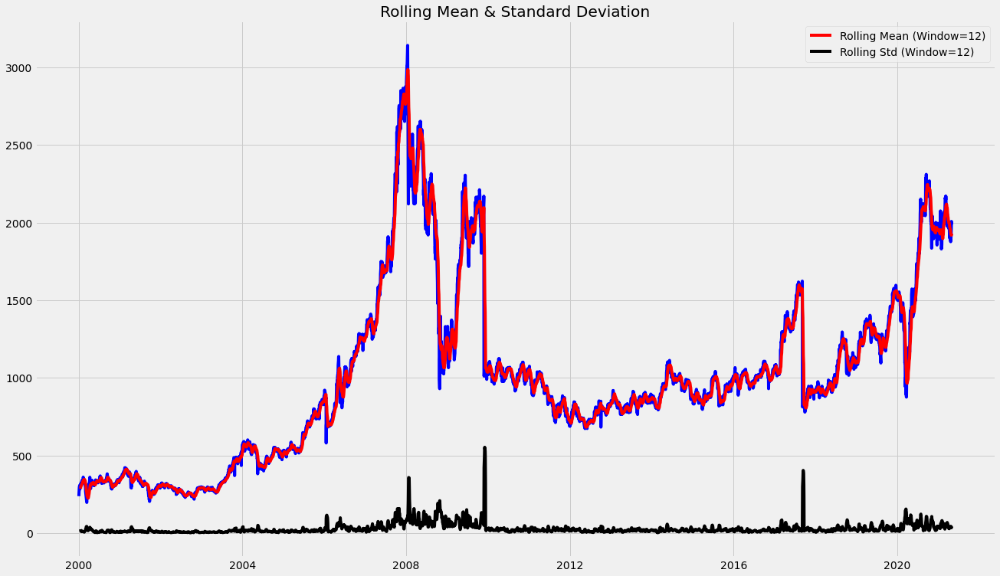

In [109]:
tsf.stationarity_check(rel_low)

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-6.532095,9.812027e-09,26,5278,True,True


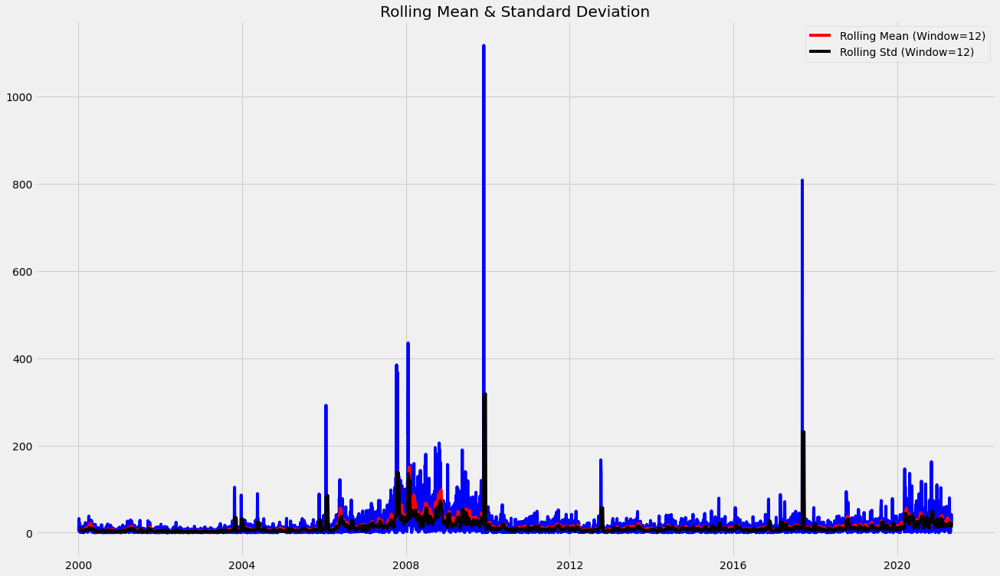

In [110]:
tsf.stationarity_check(rel_low.diff().abs().dropna())

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


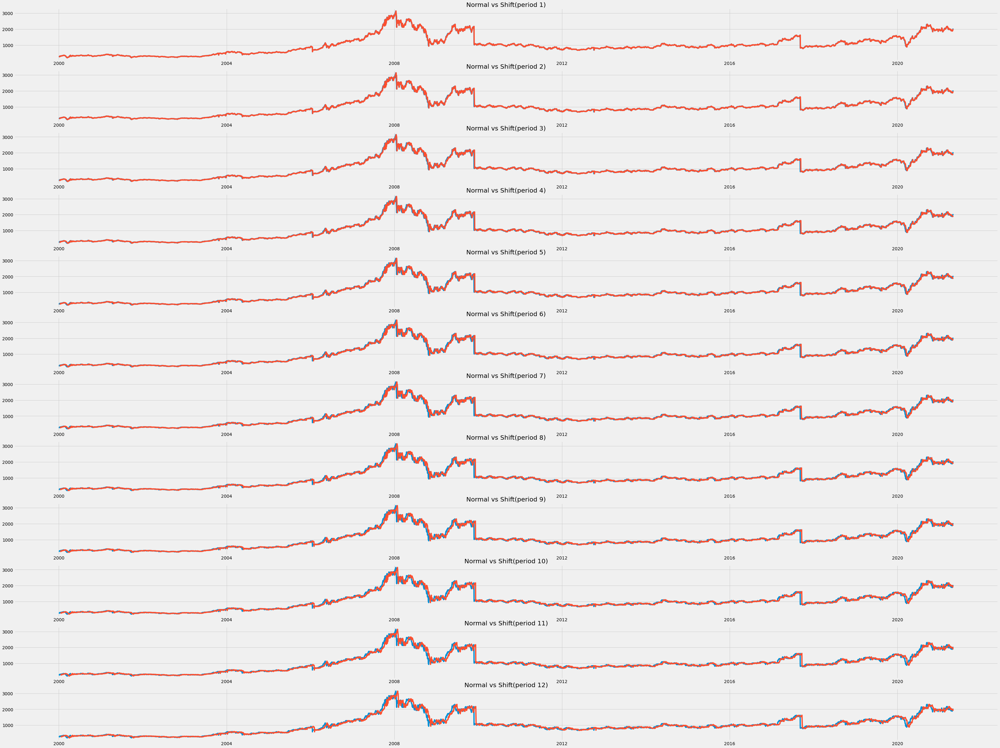

<Figure size 864x432 with 0 Axes>

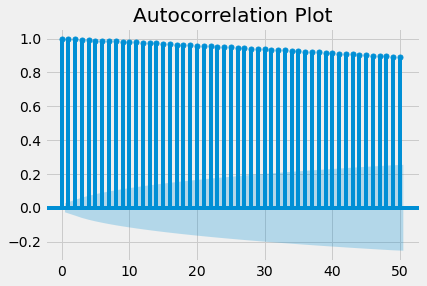

<Figure size 864x432 with 0 Axes>

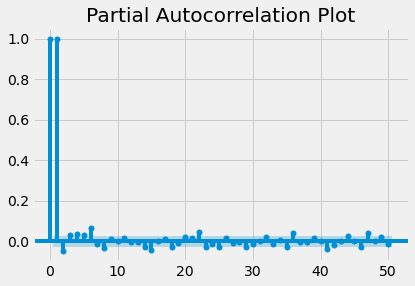

In [111]:
tsf.plot_autocorrelation(rel_low, verbose=1)

#### Volume

In [112]:
rel_vol = rel[["Volume"]]

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-4.330962,0.000392,33,5272,True,True


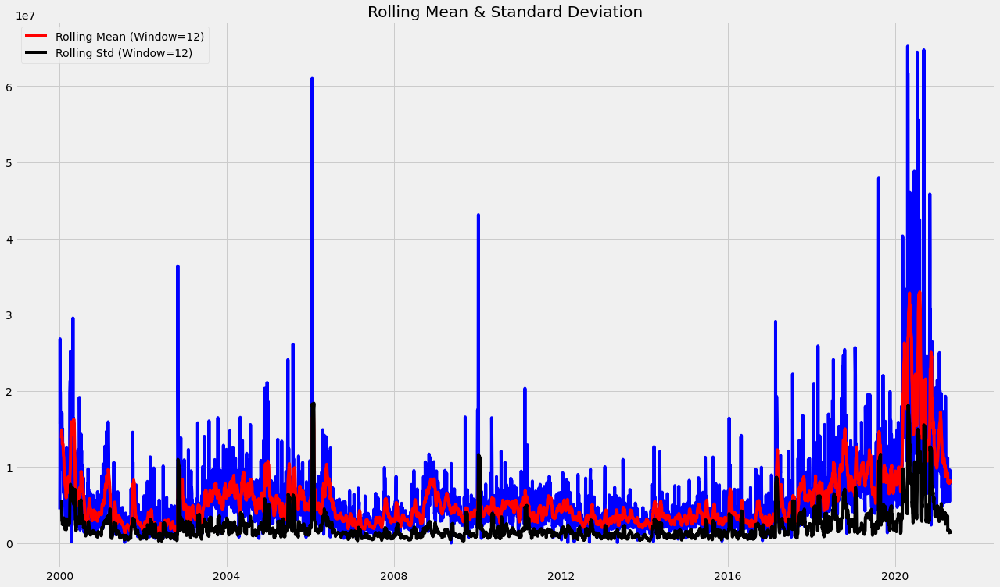

In [113]:
tsf.stationarity_check(rel_vol)

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


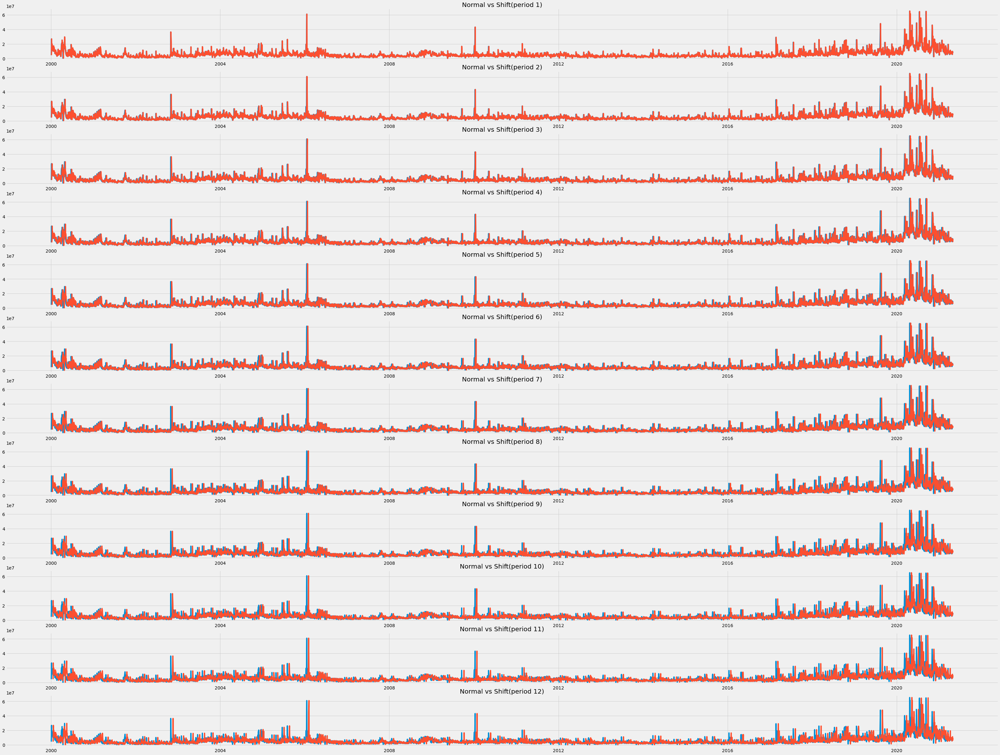

<Figure size 864x432 with 0 Axes>

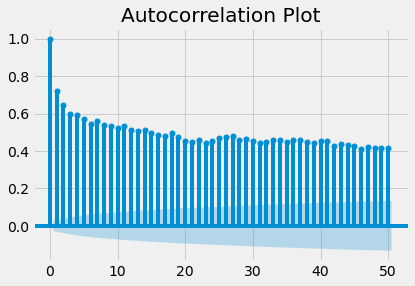

<Figure size 864x432 with 0 Axes>

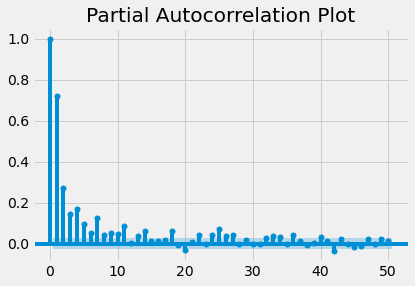

In [114]:
tsf.plot_autocorrelation(rel_vol, verbose=1)

#### VWAP

In [115]:
rel_vwap = rel[["VWAP"]]

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.837362,0.362077,7,5298,False,False


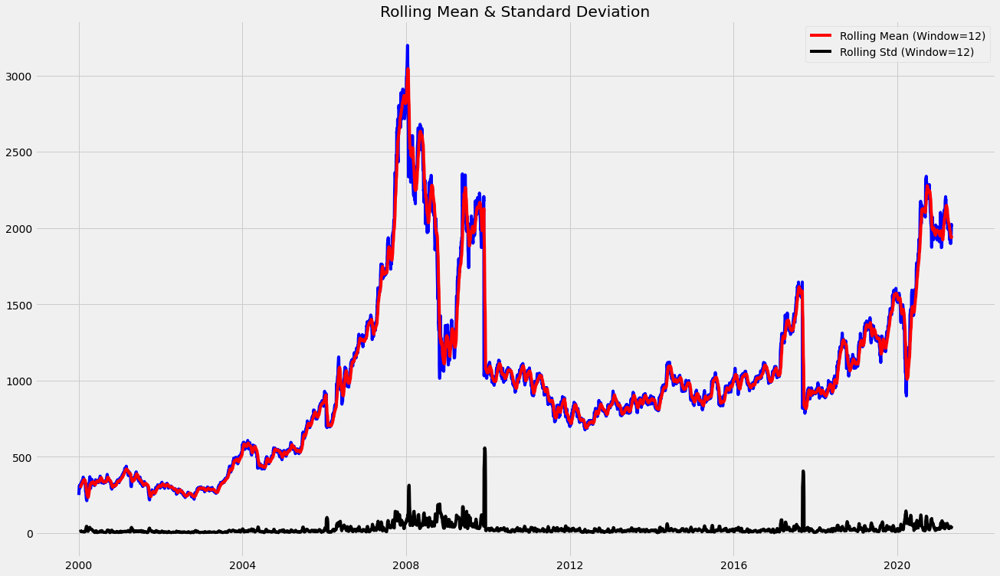

In [116]:
tsf.stationarity_check(rel_vwap)

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-5.567588,0.000001,30,5274,True,True


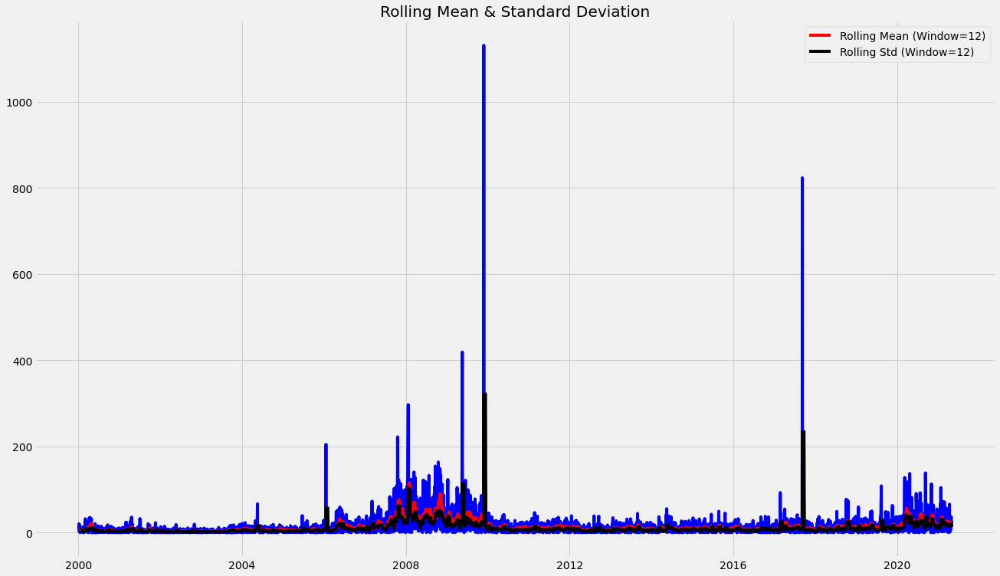

In [117]:
tsf.stationarity_check(rel_vwap.diff().abs().dropna())

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


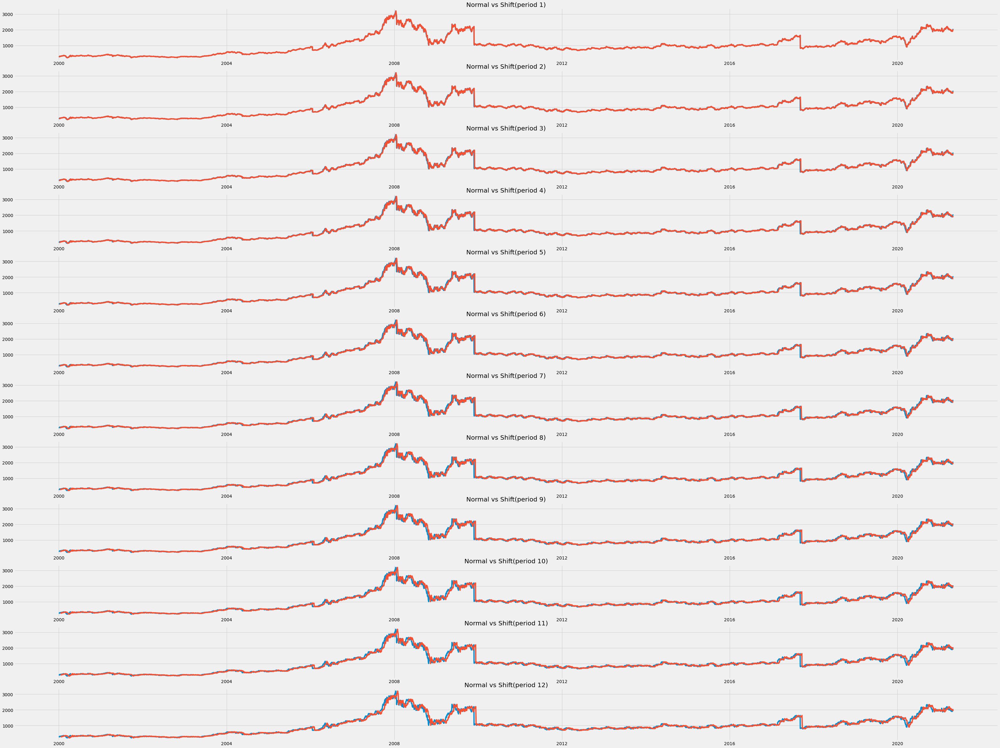

<Figure size 864x432 with 0 Axes>

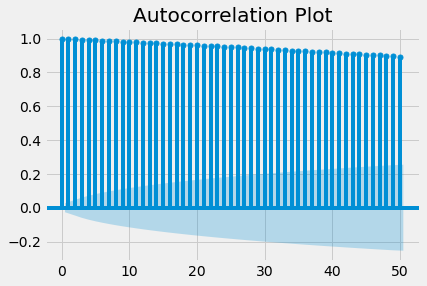

<Figure size 864x432 with 0 Axes>

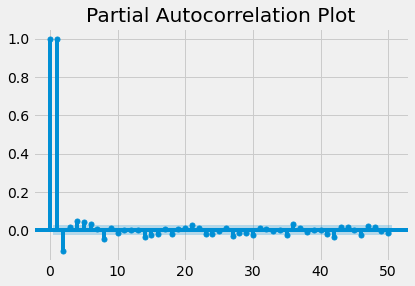

In [118]:
tsf.plot_autocorrelation(rel_vwap, verbose=1)

#### Turnover

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.741355,0.409941,33,5272,False,False


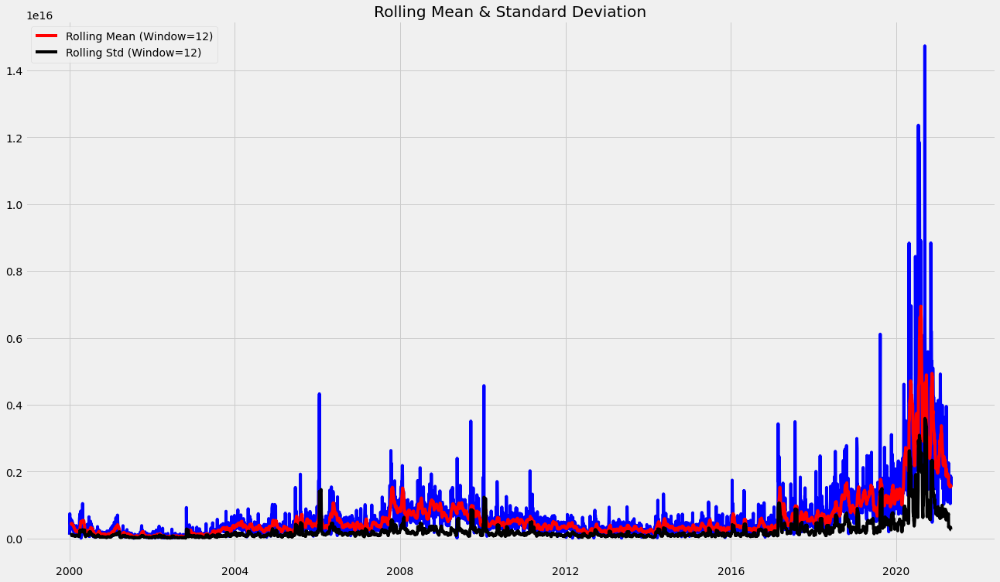

In [119]:
rel_turnover = rel[["Turnover"]]
tsf.stationarity_check(rel_turnover)

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-4.874769,0.000039,33,5271,True,True


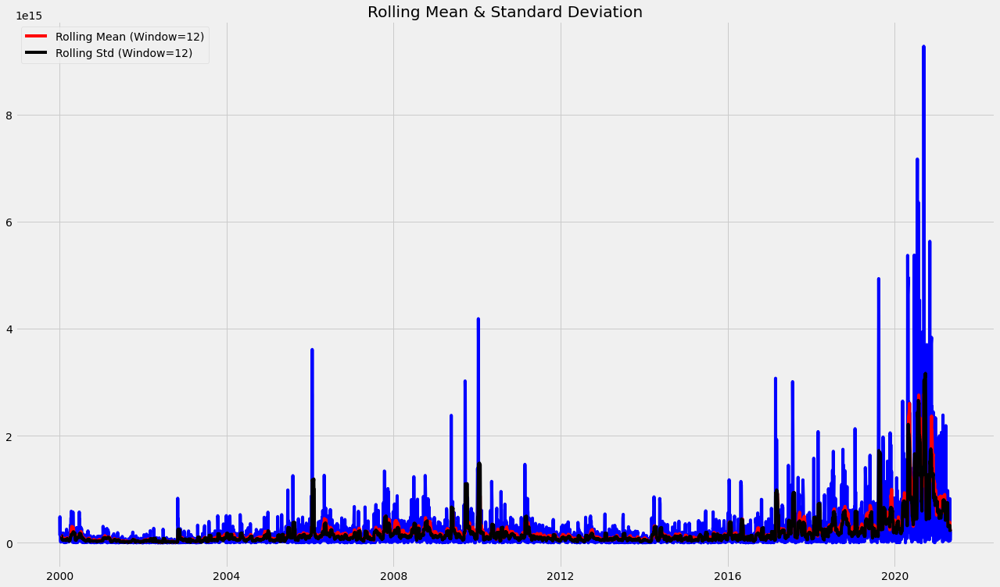

In [120]:
tsf.stationarity_check(rel_turnover.diff().abs().dropna())

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


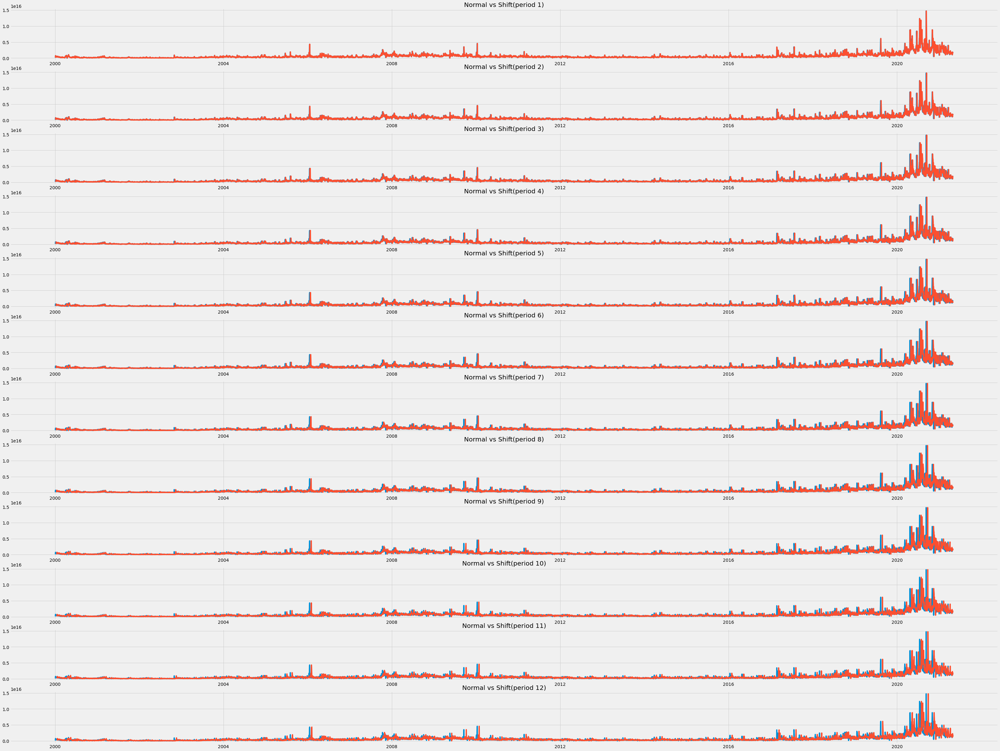

<Figure size 864x432 with 0 Axes>

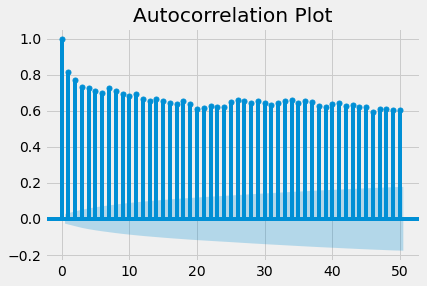

<Figure size 864x432 with 0 Axes>

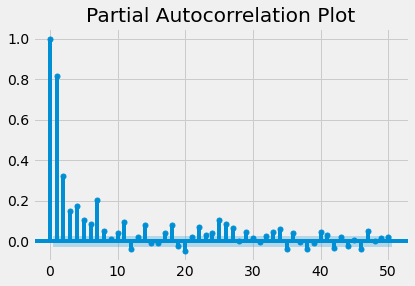

In [121]:
tsf.plot_autocorrelation(rel_turnover, verbose=1)

#### Deliverable Volume

In [122]:
rel_dev_vol = rel[["Deliverable Volume"]]

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-4.262386,0.000516,33,5272,True,True


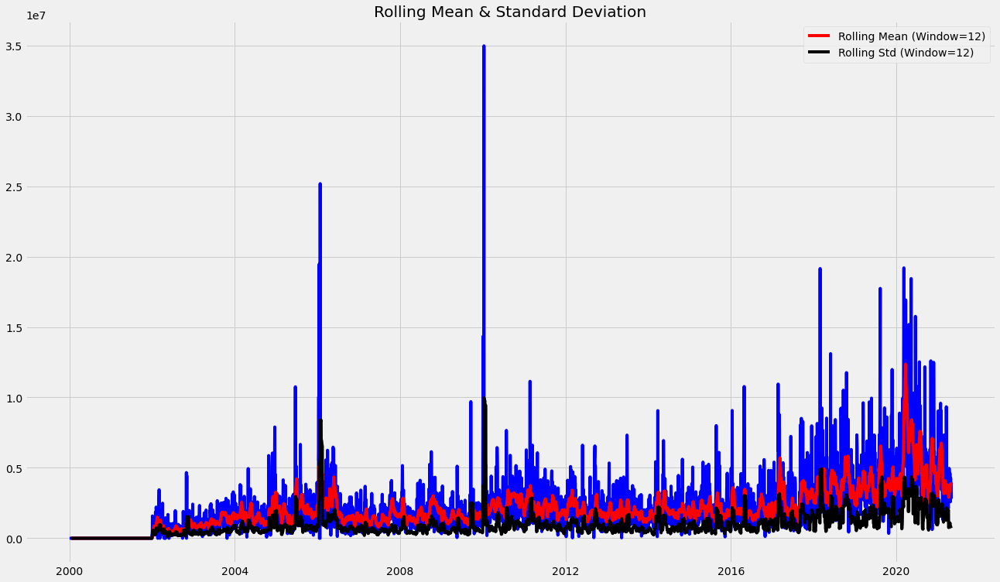

In [123]:
tsf.stationarity_check(rel_dev_vol)

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


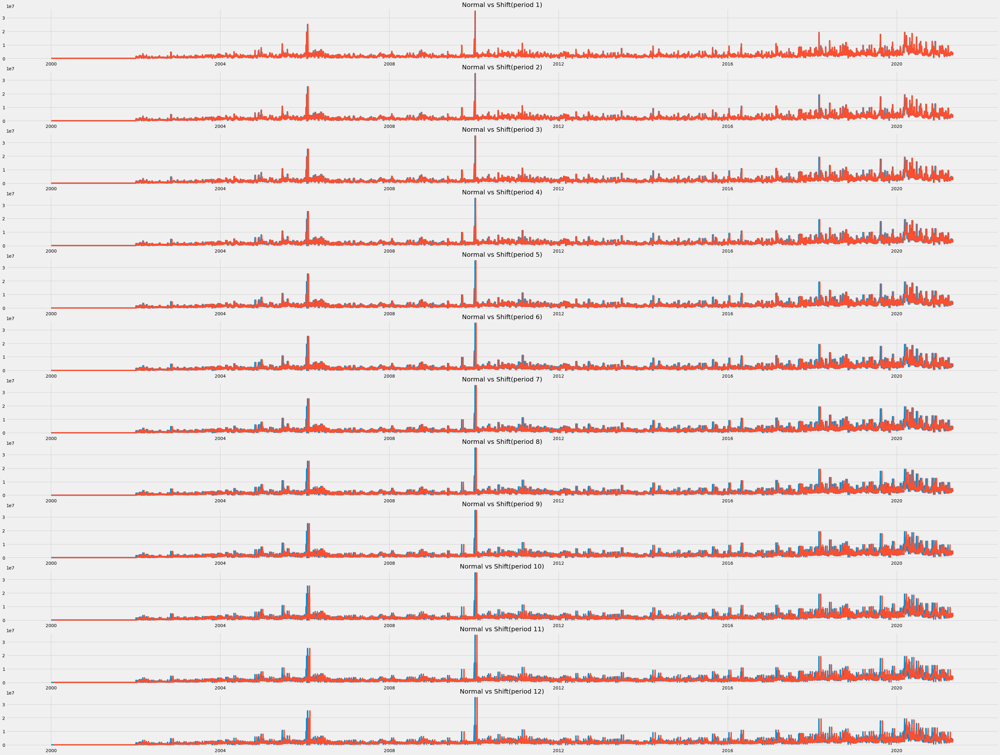

<Figure size 864x432 with 0 Axes>

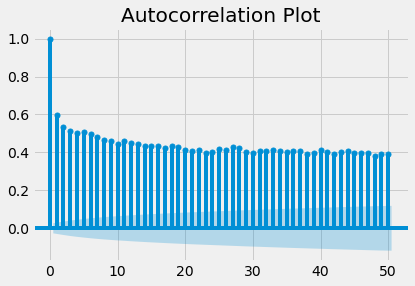

<Figure size 864x432 with 0 Axes>

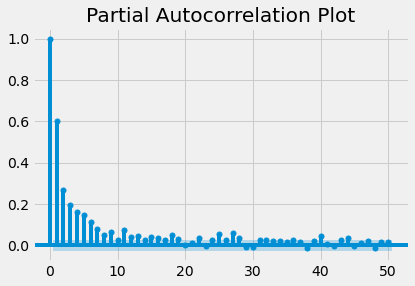

In [124]:
tsf.plot_autocorrelation(rel_dev_vol, verbose=1)

#### %Deliverable

In [125]:
rel_pcnt_del = rel[["%Deliverble"]]

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-2.850519,0.051412,32,5273,False,False


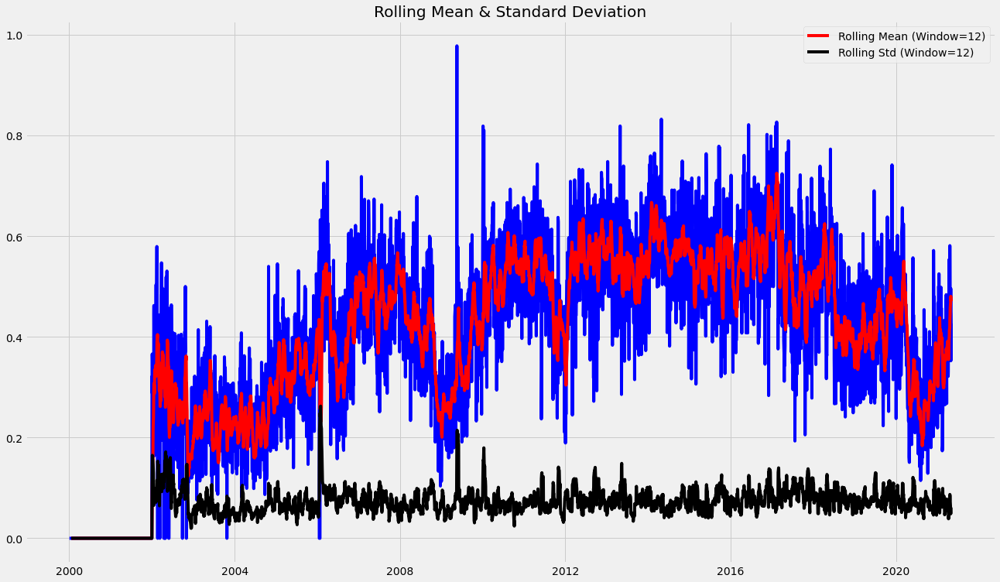

In [126]:
tsf.stationarity_check(rel_pcnt_del)

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-6.142583,7.905747e-08,31,5273,True,True


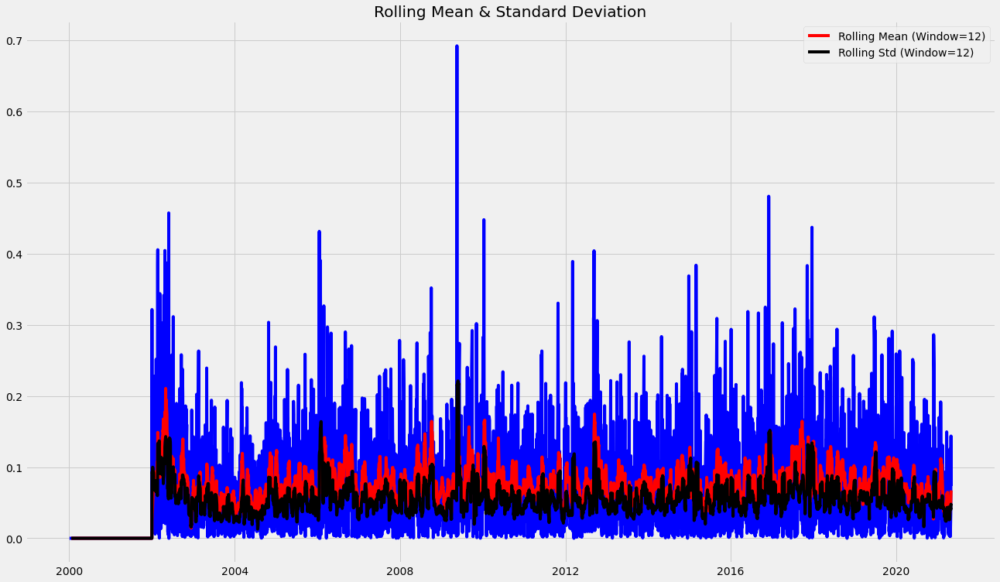

In [127]:
tsf.stationarity_check(rel_pcnt_del.diff().abs().dropna())

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


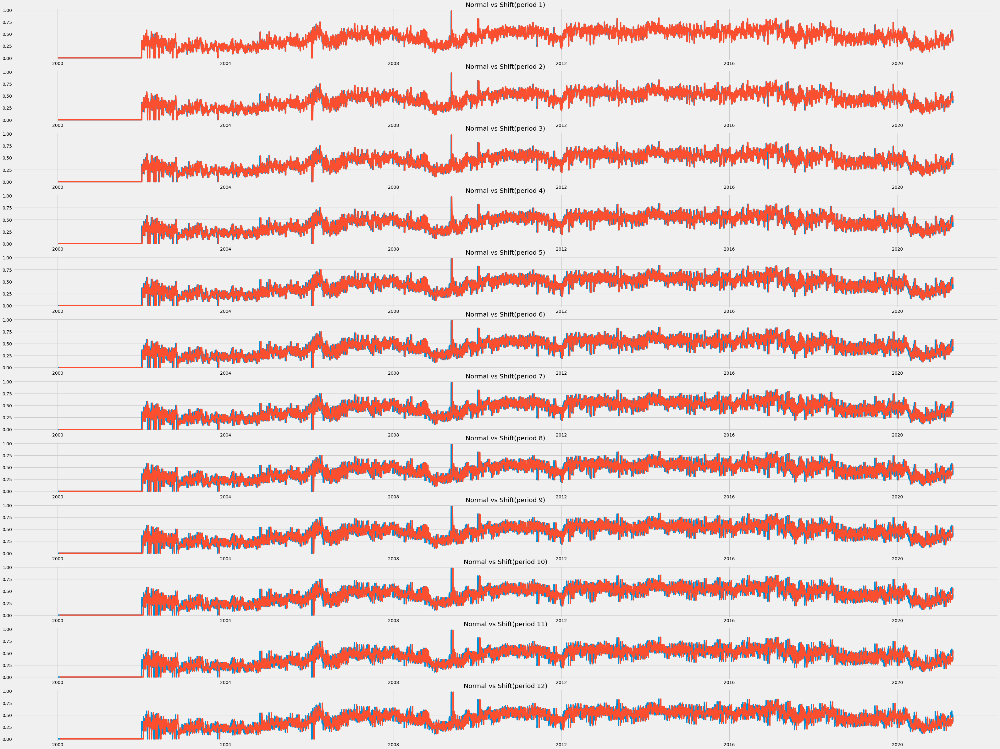

<Figure size 864x432 with 0 Axes>

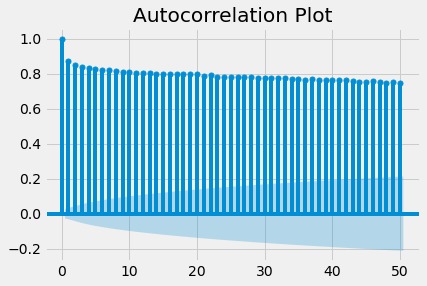

<Figure size 864x432 with 0 Axes>

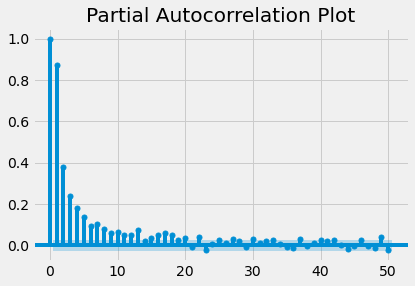

In [128]:
tsf.plot_autocorrelation(rel_pcnt_del, verbose=1)